-----------------

# Recurrent Flow Networks - NYC-P Experiment

In this Notebook, we go through all steps in the modelling pipeline used in the implementation of RFNs for the case New York Taxi - Pickups. Specifically, the notebook is structured as follows:

1. [Data Processing](#data)


2. [Recurrent Flow Network Model](#rfn)


3. [Evaluation](#eval)


4. [Visualization](#vis)

##### Requirements 

torch==1.4.0 

numpy==1.18.2

pyro==1.3.1

tqdm==4.45.0

matplotlib==3.0.3

In [1]:
# imports
import torch
from torch import nn
import pyro
from pyro.infer import SVI, Trace_ELBO
import numpy as np
from util import RFNDataset, Trace_ELBO_Wrapper, plot_heatmap
from torch.utils.data import DataLoader
from model import RFN
import tqdm
import matplotlib.pyplot as plt

In [2]:
plt.style.use("ggplot")

-----------------

<a id="data"></a>

## 1. Data Processing

Starting from raw temporal geo-spatial data (here provided for simplicity as numpy arrays), we:

- pre-process data
- construct train/validation/test split
- construct the 2-d spatial representation

In [3]:
# Load data

# 1. Spatio-Temporal Geo-coordinates (array of dimension [N, T, N_t, D])
# N: num sequences
# T: num time-steps
# N_t: num geo-coordinates at time t
# D: dimension of data point, here 2 (i.e. lat, lon)
X_train_tensor, X_valid_tensor, X_test_tensor = torch.load("./data/X_train_tensor.pt"), \
                                                torch.load("./data/X_valid_tensor.pt"), \
                                                torch.load("./data/X_test_tensor.pt")
X_tot_tensor = torch.cat((X_train_tensor, X_valid_tensor, X_test_tensor), dim=1)
# 2. 2-d Spatial representation (array of dimension [N, T, K, K])
# N: num sequences
# T: num time-steps
# K: grid dimension for approximation
U_train_tensor, U_valid_tensor, U_test_tensor = torch.load("./data/U_train_tensor.pt"), \
                                                torch.load("./data/U_valid_tensor.pt"), \
                                                torch.load("./data/U_test_tensor.pt")
U_tot_tensor = torch.cat((U_train_tensor, U_valid_tensor, U_test_tensor), dim=1)
# 3. Mask indexing vector to allow variable number of geo-coordinates in X
N_t_train, N_t_valid, N_t_test = np.load("./data/N_t_train.npy"), \
                                np.load("./data/N_t_valid.npy"), \
                                np.load("./data/N_t_test.npy")
N_t_tot = np.concatenate((N_t_train, N_t_valid, N_t_test), axis=0)

In [4]:
# Create Iterable torch Dataset
nyp_dataset = RFNDataset(X_train_tensor, U_train_tensor)
dataloader = DataLoader(nyp_dataset, batch_size=1,
                        shuffle=True, num_workers=0)

-----------------

<a id="rfn"></a>

## 2. Recurrent Flow Network Model

After loading and setting up the data, we:

- define the RFN object
- train model on the step-wise ELBO formulation defined in Eq.(17)

#### 2.1 Instantiate model

In [14]:
# (Optional) select GPU device
torch.cuda.set_device(1)
torch.cuda.requires_grad = True

In [15]:
rfn = RFN(input_dim=2, z_dim=128, u_dim=32, prior_dim=128,
            decoder_dim=64, split_dim=1, decoder_layers=2, flow_length=35,
            encoder_dim=128, lstm_dim=128, k=64,
            use_cuda=True)

#### 2.2 Train model

In [17]:
# Build SVI object - with pyro_scheduler as described in subsection "Training" (page 6)
optimizer = torch.optim.Adam
pyro_scheduler = pyro.optim.ReduceLROnPlateau({'optimizer': optimizer, 'optim_args': {'lr': 0.003}, 'patience': 100, 'verbose':True})
svi = SVI(rfn.model, rfn.guide, pyro_scheduler, Trace_ELBO_Wrapper(num_particles=1))

In [46]:
# Implements training procedure as specified in subsection "Training". In particular, notice:
# 1. T_a: represent number of epochs for the KL annealing (we set it to be equal to the total number of epochs)
# 2. (Optional) We use model checkpointing based on Validation Loss

num_epochs = 10000
losses = []
kl_losses = []
ll_losses = []
valid_ll_losses = []
pyro.clear_param_store()
T_a = 10000
epochs = tqdm.trange(num_epochs)
best_loss = -np.inf

if rfn.use_cuda:
    rfn.cuda()
    nn.ModuleList(rfn.decoder.transforms).cuda()
    nn.ModuleList(rfn.decoder.bns).cuda()
    
for epoch in epochs:
    try:
        c_i = min(1, 0.01 + (epoch+1)/T_a)
        rfn.annealing_factor = c_i
        running_loss = kl = ll = 0
        for x_i, u_i in dataloader:
            rfn.train()
            if rfn.use_cuda:
                x_i, u_i, ns_i = x_i.cuda(), u_i.cuda(), N_t_train
                x_valid, u_valid = X_valid_tensor.cuda(), U_valid_tensor.cuda()
            loss, kl, ll = svi.step(x_i, u_i, ns_i) / (ns_i.sum())
            running_loss += loss
            pyro_scheduler.step(loss)
            del x_i, u_i
            torch.cuda.empty_cache()
            for param_group in pyro_scheduler.get_state():
                _last_lr = pyro_scheduler.get_state()[param_group]['_last_lr'][0]
                break
            #validation
            rfn.eval()
            valid_ll = rfn._get_log_likelihood(X=x_valid, U=u_valid, mask=N_t_valid, num_particles=1).sum().item() / N_t_valid.sum()
            epochs.set_description("ELBO: {:.3f} | KL: {:.3f} | LL: {:.3f} | StepSize: {} -- Validation LL: {:.3f}".format(-loss, kl, ll, _last_lr, valid_ll))
#             to use checkpointing, uncomment below
            if valid_ll >= best_loss:
                torch.save(rfn, "RFN_checkpoint")
                best_loss = valid_ll
            losses.append(float(-loss))
            kl_losses.append(float(kl))
            ll_losses.append(float(ll))
            valid_ll_losses.append(float(valid_ll))
            torch.cuda.empty_cache()
            del loss, kl, ll, valid_ll
    except KeyboardInterrupt:
        fig = plt.figure(figsize=(18, 6))
        fig.add_subplot(131)
        plt.plot(losses, label="ELBO")
        plt.legend()
        fig.add_subplot(132)
        plt.plot(kl_losses, label="KL")
        plt.legend()
        fig.add_subplot(133)
        plt.plot(ll_losses, label="Train Marginal Likelihood")
        plt.plot(valid_ll_losses, label="Validation Marginal Likelihood")
        plt.legend()
        plt.show()
        break

#### 2.3 Load Model

In [18]:
rfn = RFN(input_dim=2, z_dim=128, u_dim=32, prior_dim=128,
            decoder_dim=64, split_dim=1, decoder_layers=2, flow_length=35,
            encoder_dim=128, lstm_dim=128, k=64,
            use_cuda=True)
rfn.load_state_dict(torch.load("rfn_saved_2"))
nn.ModuleList(rfn.decoder.transforms).load_state_dict(torch.load("transforms_saved"))
nn.ModuleList(rfn.decoder.bns).load_state_dict(torch.load("bns_saved"))

<All keys matched successfully>

-----------------

<a id="eval"></a>

## 3. Evaluation

After having trained/loaded the model, we:

- Evaluate an estimate of the marginal log-likelihood through importance sampling, as discussed in subsection "Results" (page 7)
- Compute full spatial grid heatmap (as in Fig. 3)
- Generate animated .gif of the spatio-temporal density evolution under the trained RFN 

In [27]:
# If model is on GPU, de-cuda-ize
if rfn.use_cuda:
    rfn.cpu()
    nn.ModuleList(rfn.decoder.transforms).cpu()
    nn.ModuleList(rfn.decoder.bns).cpu()
    rfn.eval()
    nn.ModuleList(rfn.decoder.transforms).eval()
    nn.ModuleList(rfn.decoder.bns).eval()

In [28]:
# Evaluate estimate of marginal log-likelihood through importance sampling (i.e. num_particles)
entire_data_probs = rfn._get_log_likelihood(X=X_tot_tensor, U=U_tot_tensor, mask=N_t_tot, num_particles=30)

In [50]:
print("======= Marginal Log-likelihood =======\n")
print("Train: {:.0f}".format(entire_data_probs[:180].sum().item()))
print("Validation: {:.0f}".format(entire_data_probs[180:-90].sum().item()))
print("Test: {:.0f}".format(entire_data_probs[-90:].sum().item()))
print("\n======================================")

======= Marginal Log-likelihood =======

Train: 355957
Validation: 193403
Test: 168570



-----------------

<a id="vis"></a>

## 4. Visualization

#### 4.1. Density Heatmap

In [31]:
# generate grid of nx**2 points in both scaled and original formats (reshaped as 2 column matrix)
t = -180
nx = 110
xvalues = torch.linspace(0., 1., nx)
yvalues = torch.linspace(0., 1., nx)

xx, yy = torch.meshgrid(xvalues, yvalues)

grid = torch.zeros((len(xx)**2, 2))
for i in range(len(xx)):
    grid[nx*i:nx*(i+1), :] = torch.cat((xx[i].view(-1,1), yy[i].view(-1,1)), dim=1) 
grid = grid.reshape(1, 1, -1, 2)
grid = grid.repeat(1, X_tot_tensor.shape[1], 1, 1)

In [32]:
# Evaluate log likelihood on the entire grid
grid_log_probs = rfn._get_log_likelihood(X=grid[:, :23], U=U_tot_tensor[:, :23], mask=None, num_particles=1)

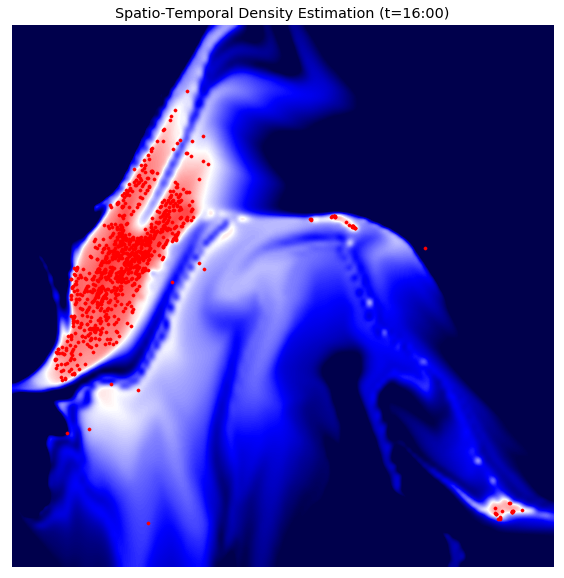

In [37]:
# Plot heatmap of the estimated density
plot_heatmap(grid, X_tot_tensor, N_t_tot, grid_log_probs, t=8)

#### Animated Density Plot

For further visualization of the temporal evolution of the learnt density, we provide code for generating .gif file of the animated density.

In [38]:
from matplotlib import animation, rc
from IPython.display import HTML, Image

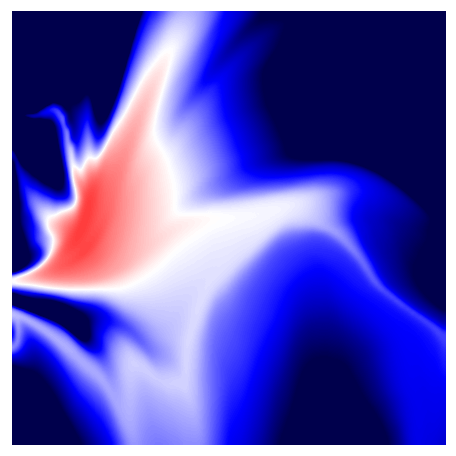

In [39]:
# First set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots(figsize=(8,8))
ax.set_xlim([-1, 0])
ax.set_ylim([0, 1])
plt.grid(b=None)
plt.xticks([])
plt.yticks([])

df_grid = pd.concat((pd.DataFrame(grid[0, 0, :, 0].detach().numpy(), columns=["lat"]),
                         pd.DataFrame(grid[0, 0, :, 1].detach().numpy(), columns=["lon"]),
                         pd.DataFrame(grid_log_probs[0].detach().numpy(), columns=["log_prob"])), axis=1)

imshow = ax.imshow(np.flip(df_grid["log_prob"].values.reshape(110, 110), axis=1), origin="lower", interpolation="bicubic",
                    alpha=1, vmax=10., vmin=-10., cmap="seismic", extent=(-1, 0, 0, 1))

In [42]:
n = 6
def animate(i):
    l = i//n
    df_grid = pd.concat((pd.DataFrame(grid[0, 0].detach().numpy(), columns=["lat", "lon"]), pd.DataFrame(grid_log_probs[l].detach().numpy(), columns=["log_prob"])), axis=1)
    imshow.set_array(np.flip(df_grid["log_prob"].values.reshape(110, 110), axis=1))
    return imshow

In [43]:
anim = animation.FuncAnimation(fig, animate, frames=21*6, interval=200, blit=False, repeat=True)

In [44]:
anim.save('rfn_animated.gif', writer='imagemagick', fps=30)

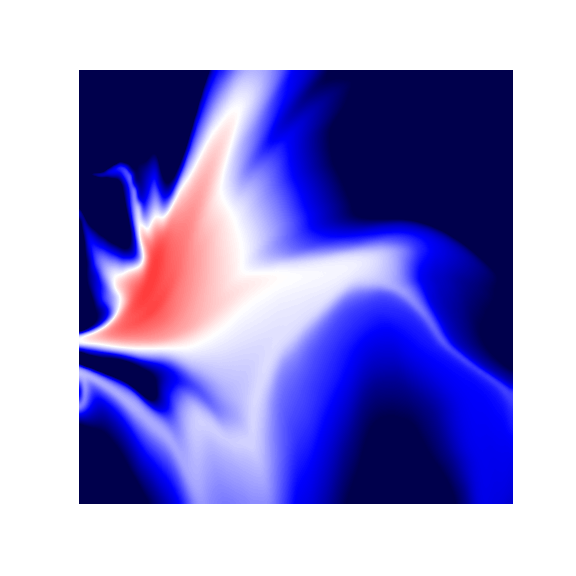

In [45]:
Image("rfn_animated.gif")